<a href="https://colab.research.google.com/github/BrianMohamadSafiudin/PCVK_Ganjil_2023/blob/main/Kuis2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Anggota Kelompok 6 :**

- 2141720133 - Brian Mohamad Safiudin
- 2141720059 - Febryan Rizki Hidayatullah
- 2141720140 - M. Rizky Mafazan


---
# **Kuis 2 Praktikum**
---

1. Bentuk kelompok beranggotakan maksimal 3 orang
2. Lakukan foto KTM setiap anggota kelompok menggunakan kamera smartphone yang berbeda dari setiap anggota (contoh: satu kelompok berisi mahasiswa A, B, dan C. Setiap dari si A, B, dan C memotret KTM miliknya dan KTM temannya lain dalam satu kelompok, sehingga total dataset yang dimiliki adalah 9 citra KTM)
3. Di dalam Google Drive, buat folder dataset, di dalam folder dataset, buat folder sesuai merkdan tipe smartphone yang digunakan (contoh: SamsungS21Ultra, PocoX3, dll) dan masukkan setiap hasil foto dari setiap smartphone ke folder dengan nama yang sesuai.
4. Bagikan folder dataset ke setiap anggota kelompok dan email: enggar@polinema.ac.id
5. Lakukan preprocessing ke setiap citra dataset
6. Lakukan deteksi object karakter huruf dan angka untuk setiap citra dataset.
7. Tunjukkan setiap hasil nomor 5 dan 6 di dalam Google Colab.
8. Bagikan Google Colab ke email: enggar@polinema.ac.id.
9. Buat video presentasi (tampak muka dan terdengar suara) hasil pengerjaan kuis praktikum, cantumkan video pada Google Colab.
10. Jaga agar folder dataset dan Google Colab tidak terset sebagai public, tetap bagikan sesuai ketentuan nomor 4

---
## **Import Data**
---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Import Library
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import os

---
## **Preprocessing**
---

In [3]:
# Direktori tempat gambar-gambar berada
direct_data1 = '/content/drive/MyDrive/PCVK/kuis2/dataset/Iphone11'
direct_data2 = '/content/drive/MyDrive/PCVK/kuis2/dataset/OppoF7Pro'
direct_data3 = '/content/drive/MyDrive/PCVK/kuis2/dataset/XiaomiRedmiNote5'

# List Direktori
directories = [direct_data1, direct_data2, direct_data3]

# Load HaarCascade untuk deteksi
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/PCVK/kuis2/haarcascades/haarcascade_frontalface_alt.xml')

---
## **Deteksi Wajah**
---

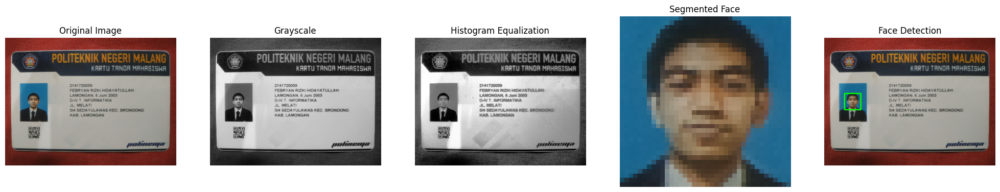

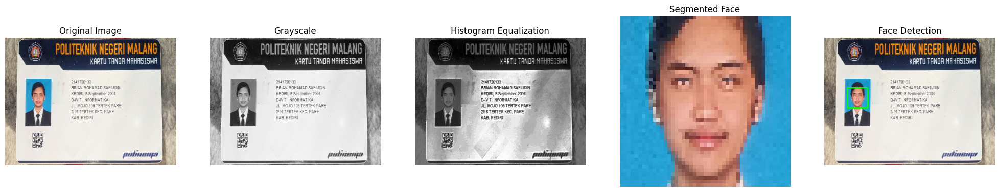

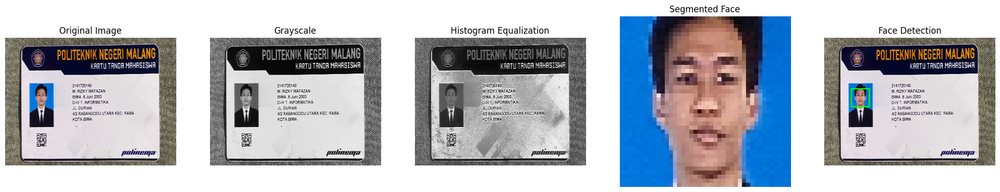

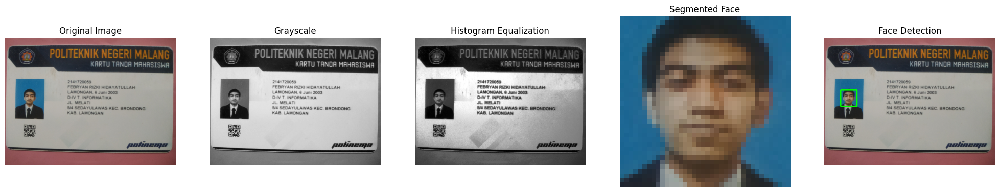

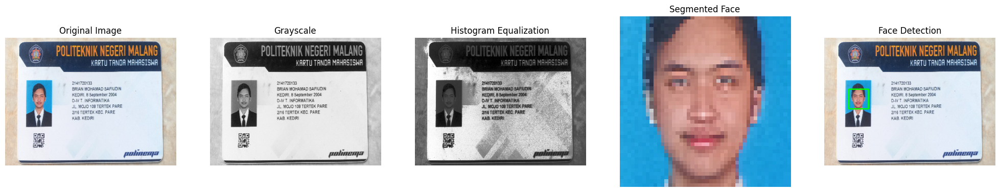

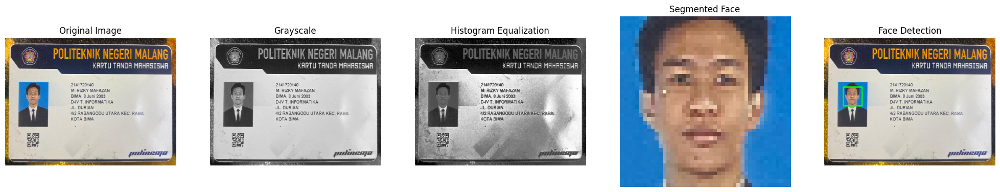

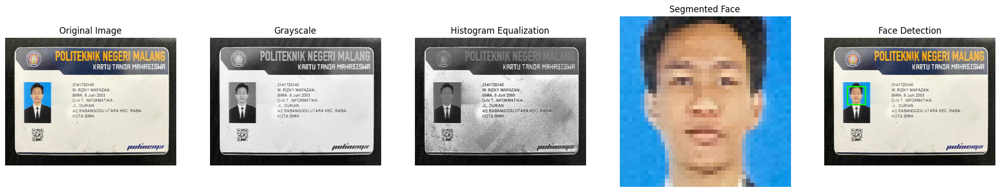

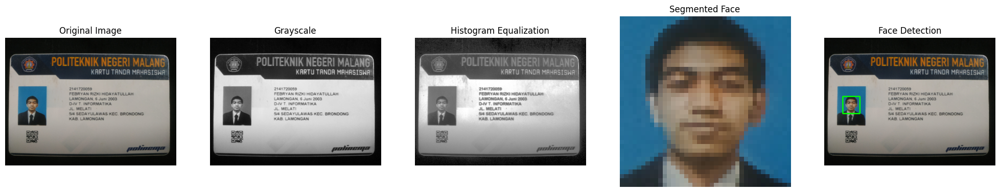

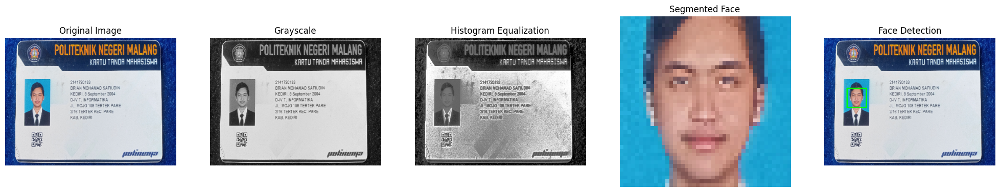

In [4]:
# Menggunakan os.listdir untuk mengambil daftar file dalam direktori
for direct_data in directories:
    files = os.listdir(direct_data)

    # Loop melalui semua gambar dalam direktori
    for i, img_file in enumerate(files, start=1):
        img_path = os.path.join(direct_data, img_file)
        img = cv2.imread(img_path)

        # PREPROCESSING
        # (1) Resize the image
        img = cv2.resize(img, (400, 300))

        # (2) Convert to Grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # (3) Histogram Equalization
        equalized_img = cv2.equalizeHist(gray_img)

        # (4) Lokalisasi (Face Detection)
        faces = cascade_wajah.detectMultiScale(img, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        # SEGEMENTASI DAN RECOGNIZATION
        for (x, y, w, h) in faces:
            # (5) Segmentasi (Crop Wajah)
            face_segment = img[y:y+h, x:x+w]

            # Tampilkan hasil segmentasi dan pengenalan wajah
            plt.figure(figsize=(25, 6))

            # Gambar asli
            plt.subplot(151)
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title('Original Image')
            plt.axis('off')

            # Grayscale image (PREPROCESSING)
            plt.subplot(152)
            plt.imshow(gray_img, cmap='gray')
            plt.title('Grayscale')
            plt.axis('off')

            # Equalized Image (PREPROCESSING)
            plt.subplot(153)
            plt.imshow(equalized_img, cmap='gray')
            plt.title('Histogram Equalization')
            plt.axis('off')

            # Gambar Segmentasi Wajah
            plt.subplot(154)
            plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB))
            plt.title('Segmented Face')
            plt.axis('off')

            # Gambar dengan kotak di sekitar wajah (Lokalisasi - Face Detection)
            img_with_boxes = img.copy()
            cv2.rectangle(img_with_boxes, (x, y), (x+w, y+h), (0, 255, 0), 2)
            plt.subplot(155)
            plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title('Face Detection')
            plt.axis('off')

            plt.show()

---
## **Deteksi Objek Karakter**
---

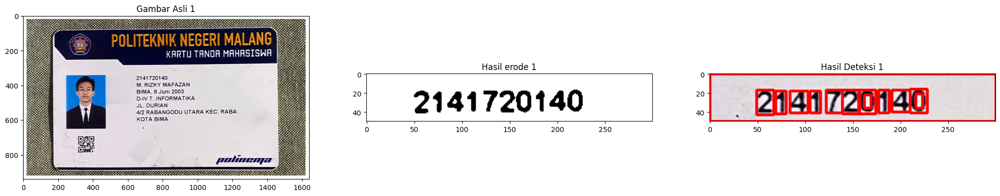

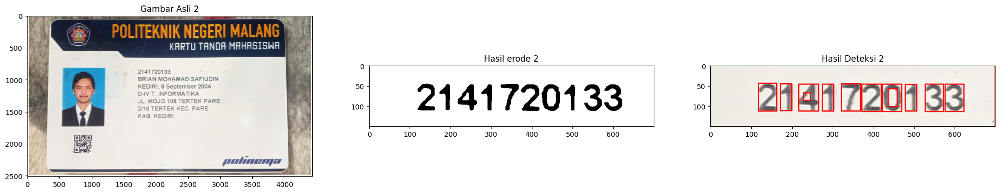

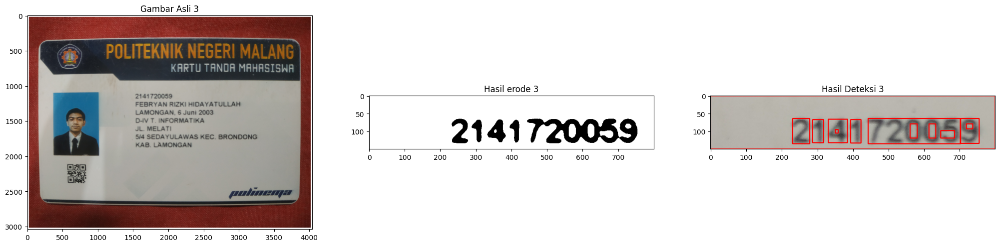

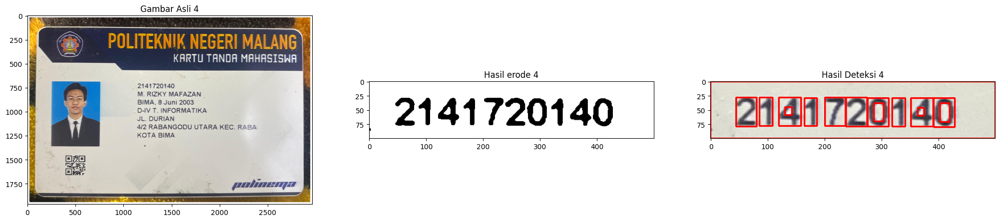

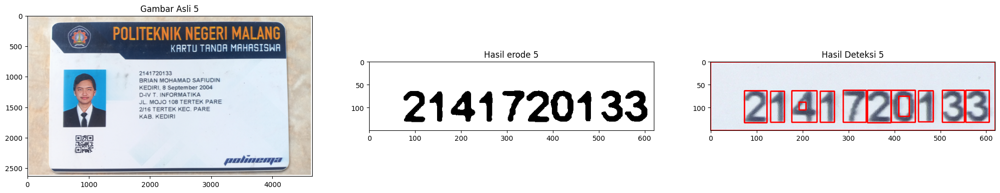

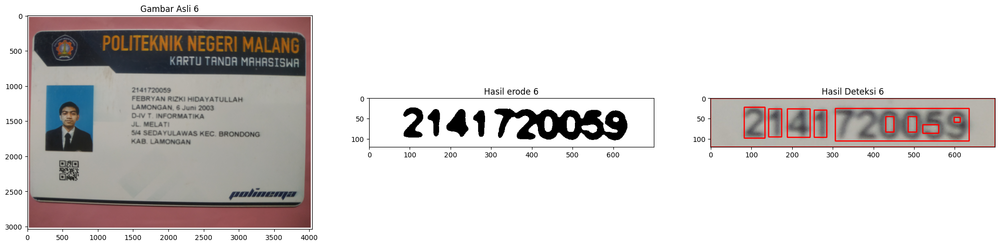

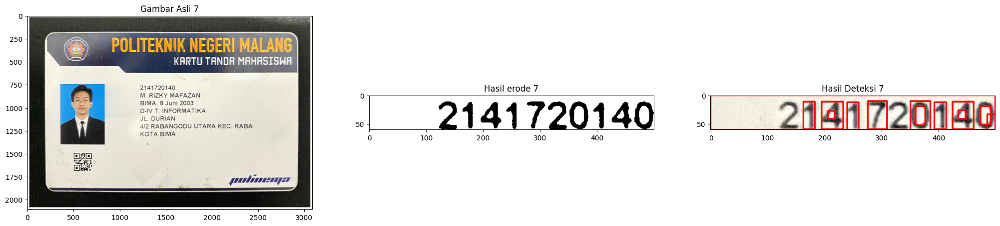

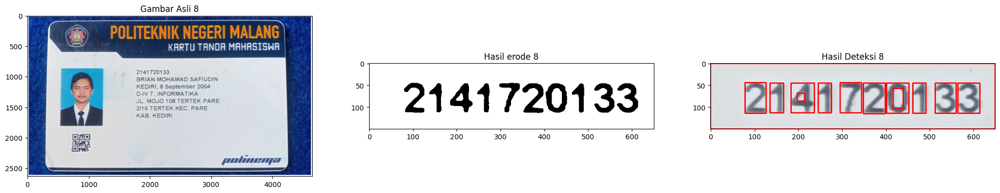

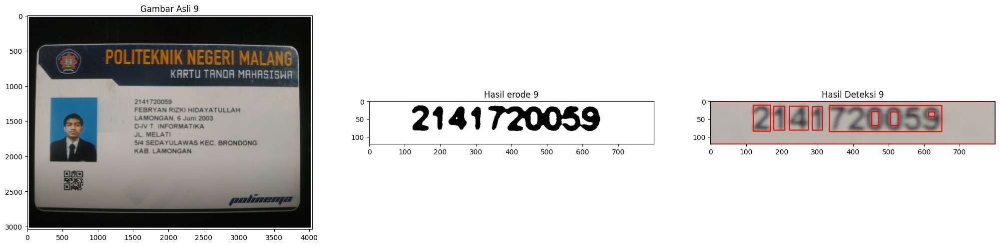

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Daftar path citra
image_paths = [
    '/content/drive/MyDrive/PCVK/kuis2/dataset/Iphone11/MafazanKTM.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/Iphone11/BrianKTM.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/Iphone11/FebryanKTM.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/OppoF7Pro/MafazanKTM2.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/OppoF7Pro/BrianKTM2.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/OppoF7Pro/FebryanKTM2.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/XiaomiRedmiNote5/MafazanKTM3.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/XiaomiRedmiNote5/BrianKTM3.jpg',
    '/content/drive/MyDrive/PCVK/kuis2/dataset/XiaomiRedmiNote5/FebryanKTM3.jpg',
]

def process_image(image_path):
    # Membaca citra KTP dari path tertentu
    ktp = cv2.imread(image_path)

    # Menambahkan border putih sebesar 20 piksel di sekeliling citra KTP
    ktp = cv2.copyMakeBorder(
        src=ktp,
        top=20,
        bottom=20,
        left=20,
        right=20,
        borderType=cv2.BORDER_CONSTANT,
        value=(255, 255, 255)  # Nilai warna putih dalam format RGB
    )

    # Variabel-variabel untuk menentukan koordinat crop
    if "MafazanKTM.jpg" in image_path:
        crop_coords = (330, 380, 600, 900)
    elif "MafazanKTM2.jpg" in image_path:
        crop_coords = (680, 780, 1100, 1600)
    elif "MafazanKTM3.jpg" in image_path:
        crop_coords = (750, 810, 1100, 1600)
    elif "BrianKTM.jpg" in image_path:
        crop_coords = (800, 950, 1600, 2300)
    elif "BrianKTM2.jpg" in image_path:
        crop_coords = (850, 1000, 1750, 2370)
    elif "BrianKTM3.jpg" in image_path:
        crop_coords = (850, 1000, 1700, 2350)
    elif "FebryanKTM.jpg" in image_path:
        crop_coords = (1050, 1200, 1300, 2100)
    elif "FebryanKTM2.jpg" in image_path:
        crop_coords = (1000, 1120, 1400, 2100)
    elif "FebryanKTM3.jpg" in image_path:
        crop_coords = (1180, 1300, 1400, 2200)
    else:
        # Tambahkan kondisi lain jika diperlukan
        crop_coords = (800, 950, 1600, 2300)

    # Melakukan operasi cropping
    ktp_crop = ktp[crop_coords[0]:crop_coords[1], crop_coords[2]:crop_coords[3]].copy()

    # Konversi citra KTP ke dalam citra keabuan (grayscale)
    ktp_gray = cv2.cvtColor(ktp_crop, cv2.COLOR_BGR2GRAY)

    # Melakukan operasi Gaussian Blur pada citra keabuan KTP
    ktp_blur = cv2.GaussianBlur(
        src=ktp_gray,
        ksize=(5, 5),  # Ukuran kernel Gaussian (5x5)
        sigmaX=0,
        sigmaY=0
    )

    output = ktp.copy()  # Membuat salinan citra KTP utuh
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(5, 5))  # Membuat objek CLAHE
    gray = clahe.apply(ktp_blur)  # Mengaplikasikan CLAHE pada citra hasil crop

    # Melakukan thresholding pada citra untuk menghasilkan citra biner
    ret, bw = cv2.threshold(gray.copy(), 100, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Memperjelas hasil thresholding menggunakan operasi morfologi closing
    kernel = np.ones((3, 3), np.uint8)
    closing = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel, iterations=1)
    dilate = closing.copy()  # Salinan hasil closing

    # Ekstraksi kontur dari citra hasil operasi closing
    contours, hierarchy = cv2.findContours(dilate.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Looping kontur untuk mendeteksi objek berdasarkan kriteria ukuran dan rasio aspek
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ras = format(w / h, '.2f')

        # Deteksi berdasarkan ukuran dan rasio aspek tertentu, lalu membuat bounding box pada objek yang sesuai
        if h >= 40 and w >= 10 and float(ras) <= 1:
            cv2.rectangle(ktp_crop, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
        elif h >= 8 and w >= 8 and float(ras) <= 10:
            cv2.rectangle(ktp_crop, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
        elif h >= 10 and w >= 7 and float(ras) <= 8:
            cv2.rectangle(ktp_crop, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

    return ktp, dilate, ktp_crop

# Menampilkan hasil untuk setiap citra
for i, image_path in enumerate(image_paths, start=1):
    ktp, dilate, output = process_image(image_path)

    # Menampilkan citra hasil crop, hasil operasi morfologi, dan hasil deteksi objek dengan bounding box
    f, axarr = plt.subplots(1, 3, figsize=(25, 8))
    axarr[0].imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
    axarr[0].set_title(f"Gambar Asli {i}")
    axarr[1].imshow(dilate, cmap='gray')
    axarr[1].set_title(f"Hasil erode {i}")
    axarr[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axarr[2].set_title(f"Hasil Deteksi {i}")
    plt.show()

---
## **Ekstraksi Data**
---

In [6]:
# Install library tesseract-ocr dan pytesseract
# Perintah di bawah ini menginstal Tesseract OCR, sebuah perangkat lunak pengenalan teks open-source.
!sudo apt-get install tesseract-ocr-ind

# Perintah di bawah ini menggunakan pip untuk menginstal library Pytesseract.
# Pytesseract adalah wrapper Python untuk Tesseract OCR yang memungkinkan penggunaan Tesseract OCR dengan Python.
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-ind is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 11 not upgraded.



Processing image: FebryanKTM.jpg


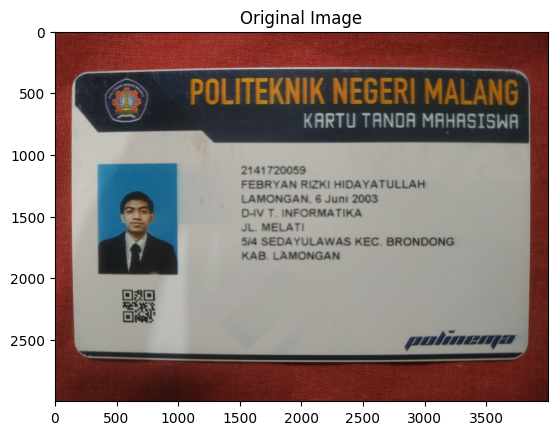

pahnenga

GAN Aa EA

0
Z
O
D
e
O
x
XM
O
WJ
Xx
UV)
,
-

J

)
|

SEO

KAB

5/4

 


Processing image: BrianKTM.jpg


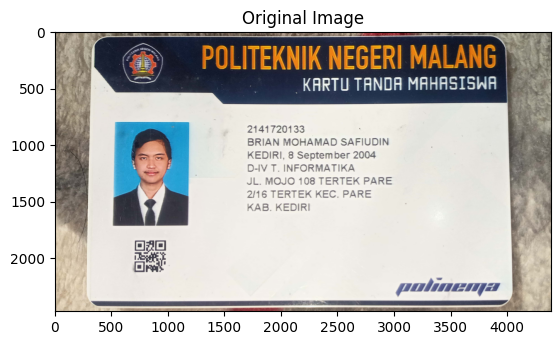

AI Ta IN Ie

KARTU TANDA MAHASISWA

 

TI III ALI YAN

 


Processing image: MafazanKTM.jpg


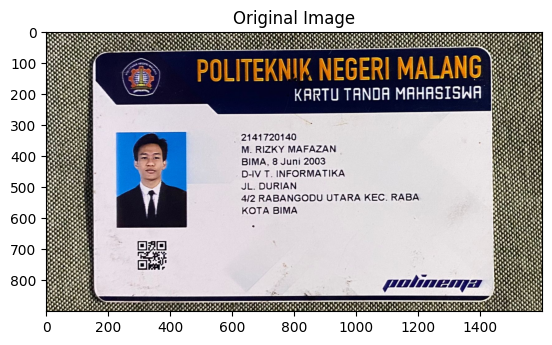

ON

KARTU TANDA MAHASISWA

| 2141720140
M. RIZKY MAFAZAN
BIMA, 8 Juni 2003
D-IV T. INFORMATIKA
JL. DURIAN
412 RABANGODU UTARA KEC. RABA
KOTA BIMA

 


Processing image: FebryanKTM2.jpg


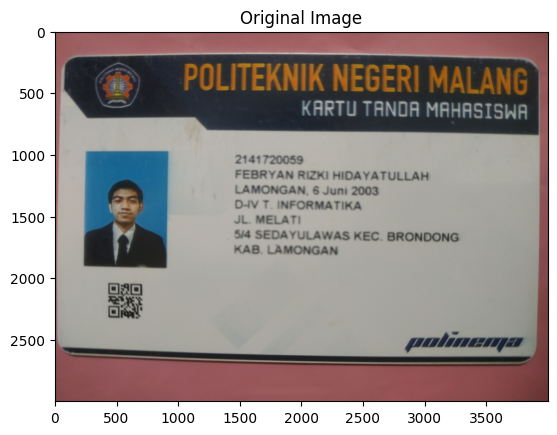

KU ANA TE

KARTU TANDA MAHASISWA

 

& “ ,
FFRBRVAN RITKI H AYATULLAH
» &A : 2» ( 3 La au
hh TV JA J «JII
: | ny Pd ah A ! pa 2
8A | , ”
3 SELVATULAWAS KEC BRONDONG
KAB LAMONGAN

 
  

 

panhnenga


Processing image: BrianKTM2.jpg


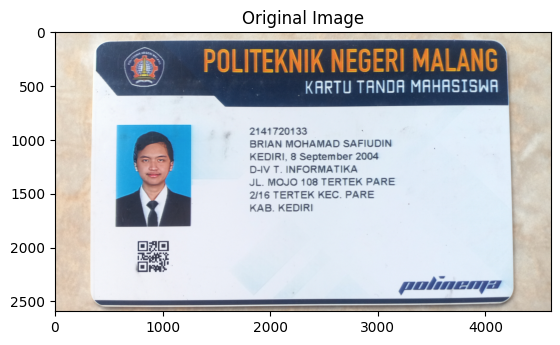

 

KITA IL

KARTU TANDA MAHASISWA

 

41720133
RIAN MOHAMAD SAFIUDIN
EDIRI 8 September 2004
IV T INFORMATIKA

1OJO 108 TERTEK PARE
18 TERTEK KEC PARE
AR KErDIPR

bd ama aa

yanalaazangaa

 


Processing image: MafazanKTM2.jpg


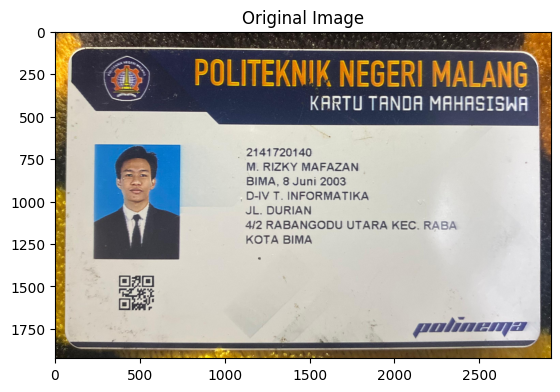

    
 

Ea

 

. 2141720140

 

Mumun dj

M. RIZKY MAFAZAN

BIMA, 8 Juni 2003

D-IV T. INFORMATIKA

JL. DURIAN

4/2 RABANGODU UTARA KEC. F
KOTA BIMA

 

 

 


Processing image: MafazanKTM3.jpg


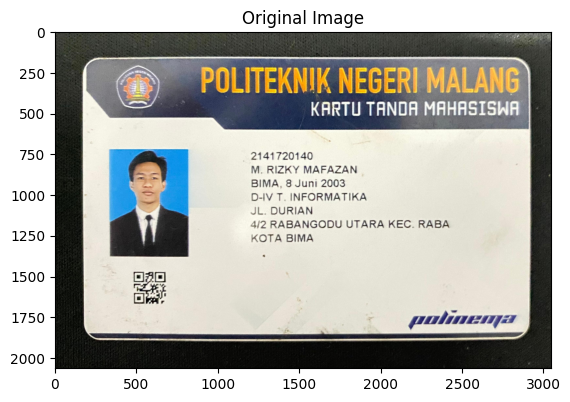

J

-
a

1

"2124,

yaaid,

 


Processing image: FebryanKTM3.jpg


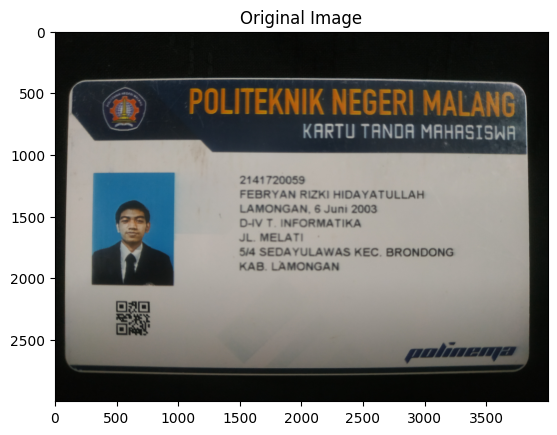

PAN Ol

Gbu La

EC BRONDONG

 


Processing image: BrianKTM3.jpg


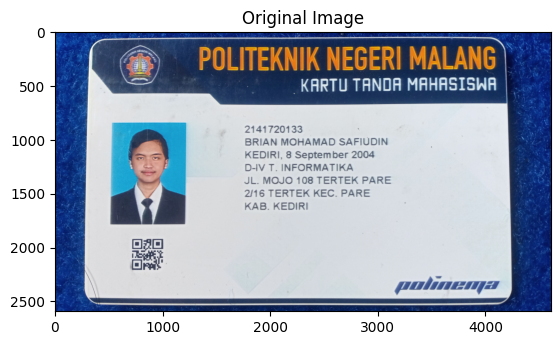

JA

Alta Aa

 



In [7]:
# LEGACY VERSION

import os  # Library untuk interaksi dengan sistem operasi
import cv2  # Library OpenCV untuk pemrosesan citra
import numpy as np  # Library untuk operasi matematika menggunakan array
import pytesseract  # Wrapper Python untuk Tesseract OCR
import matplotlib.pyplot as plt  # Library untuk visualisasi data
from PIL import Image  # Library untuk manipulasi gambar
import sys  # Library untuk interaksi dengan sistem operasi

class KTPOCR:
    def __init__(self, image_folder):
        self.image_folder = image_folder  # Inisialisasi folder gambar

    # Fungsi untuk memproses gambar menggunakan Tesseract OCR
    def process_image(self, image_path):
        img = cv2.imread(image_path)  # Membaca gambar dari path
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Mengubah gambar ke citra keabuan

        ## (2) Threshold
        th, threshed = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)  # Thresholding citra

        ## (3) Detect
        result = pytesseract.image_to_string(threshed, lang="ind")  # Mendeteksi teks pada citra menggunakan Tesseract OCR

        final = []

        ## (5) Normalize
        for word in result.split("\n"):
            if "”—" in word:
                word = word.replace("”—", ":")  # Mengganti karakter khusus menjadi tanda titik dua (:)

            # Normalisasi NIK
            if "NIK" in word:
                nik_char = word.split()
            if "?" in word:
                word = word.replace("?", "7")  # Mengganti karakter tanda tanya (?) menjadi angka 7

            final.append(word)

        return final, img  # Mengembalikan hasil ekstraksi teks dan gambar

    # Fungsi untuk menampilkan informasi dari setiap gambar dalam folder
    def display_info(self):
        for filename in os.listdir(self.image_folder):
            if filename.endswith(('.jpg', '.png', '.jpeg')):
                image_path = os.path.join(self.image_folder, filename)  # Path menuju gambar
                print(f"\nProcessing image: {filename}")
                extracted_data, image = self.process_image(image_path)  # Proses ekstraksi teks dan gambar

                # Menampilkan gambar asli
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                plt.title('Original Image')
                plt.show()

                # Menampilkan data yang diekstraksi
                for item in extracted_data:
                    print(item)

if __name__ == "__main__":
    image_folders = [
        '/content/drive/MyDrive/PCVK/kuis2/dataset/Iphone11',
        '/content/drive/MyDrive/PCVK/kuis2/dataset/OppoF7Pro',
        '/content/drive/MyDrive/PCVK/kuis2/dataset/XiaomiRedmiNote5'
    ]

    for image_folder in image_folders:
        try:
            ocr = KTPOCR(image_folder)  # Membuat instance KTPOCR dengan folder gambar yang ditentukan
            ocr.display_info()  # Menampilkan informasi yang diekstraksi dari gambar dalam folder
        except Exception as e:
            print(f"Error processing {image_folder}: {e}")